In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

## Loading data

In [15]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


## 

In [16]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [17]:
# change 
df['week_start_date'] = pd.to_datetime(df['week_start_date'])

In [18]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


In [19]:
# Checking date range
print(f"San Juan: {df.loc[df['city']=='sj','year'].unique()}")
print(f"Iquitos : {df.loc[df['city']=='iq','year'].unique()}")

San Juan: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005 2006 2007 2008]
Iquitos : [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010]


In [20]:
city_obs['n'].sum()

1456

### Checking Missing values

In [21]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [22]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature 
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [23]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [24]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss 
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [25]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [26]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [27]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [28]:
# checking mising values once again
# The remaining missing will then be imputed 
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [29]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Exploratory Data Analysis

# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [30]:
# # Making it compatible with Pipelines
# from sklearn.base import BaseEstimator, TransformerMixin

# class MissingValueImputer(BaseEstimator, TransformerMixin):
#     def __init__(self, features):
#         self.features = features
    
#     def fit(self, X, y=None):
#         return self
    
#     def transform(self, X):
#         X_copy = X.copy()
#         for f in self.features:
#             X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
#         return X_copy.reset_index()

# # Example usage:
# imputer = MissingValueImputer(features=with_missing)
# df_train = imputer.transform(df_train).drop('index', axis=1)
# df_test = imputer.transform(df_test).drop('index', axis=1)

def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()
    
    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values 
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [31]:
type(df_train)

pandas.core.frame.DataFrame

In [32]:
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [33]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
1,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
3,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
4,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1244,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
1245,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
1246,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
1247,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [34]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [35]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

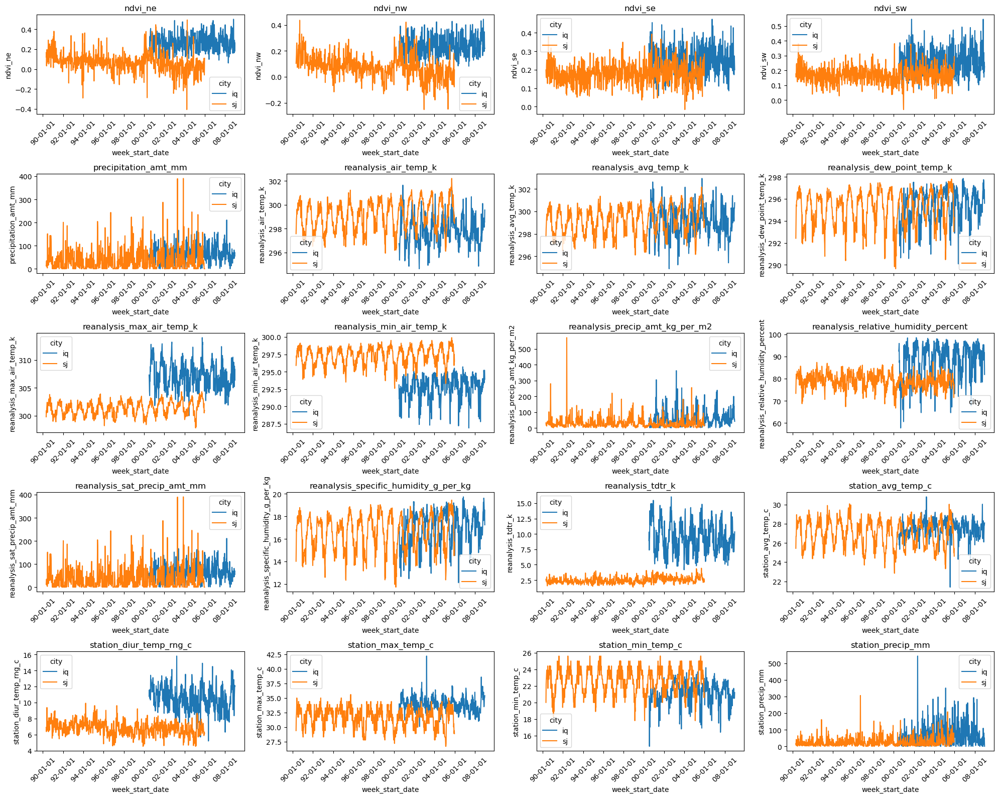

In [36]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


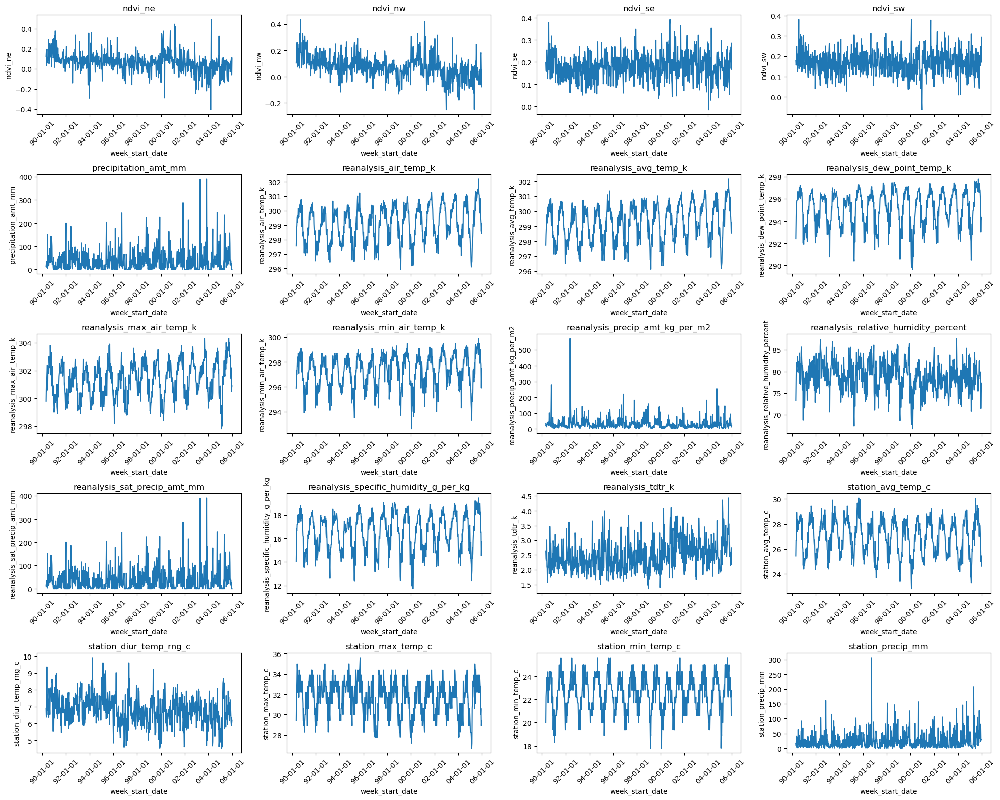

In [37]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

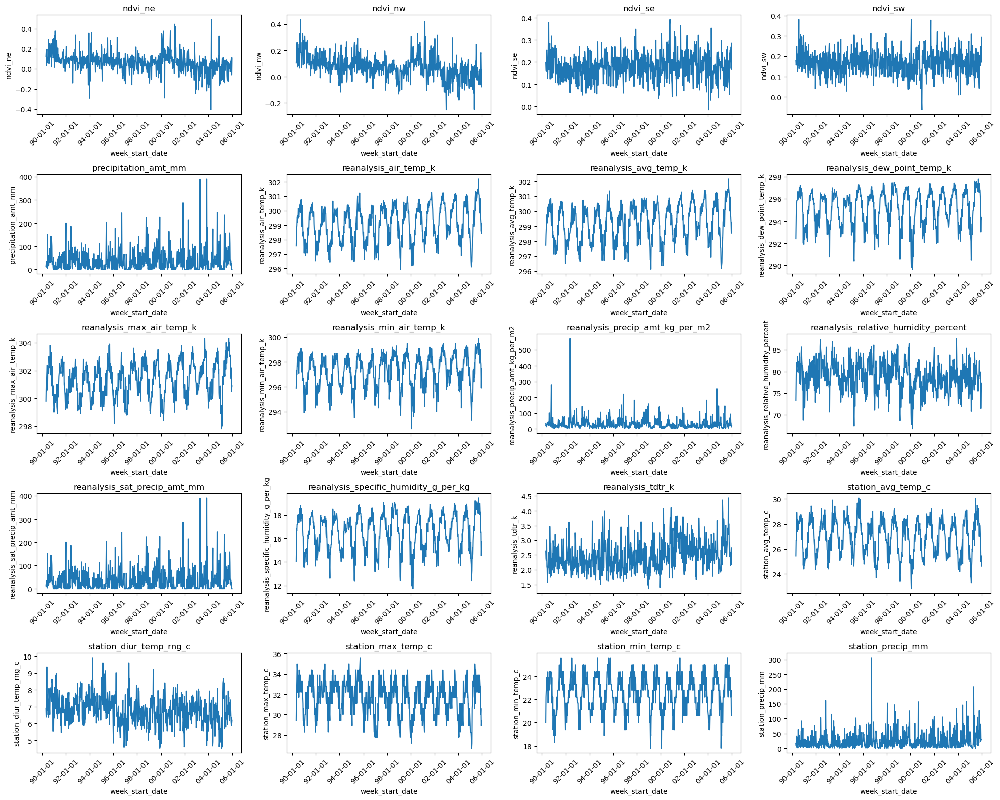

In [38]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




### Correlation San Juan

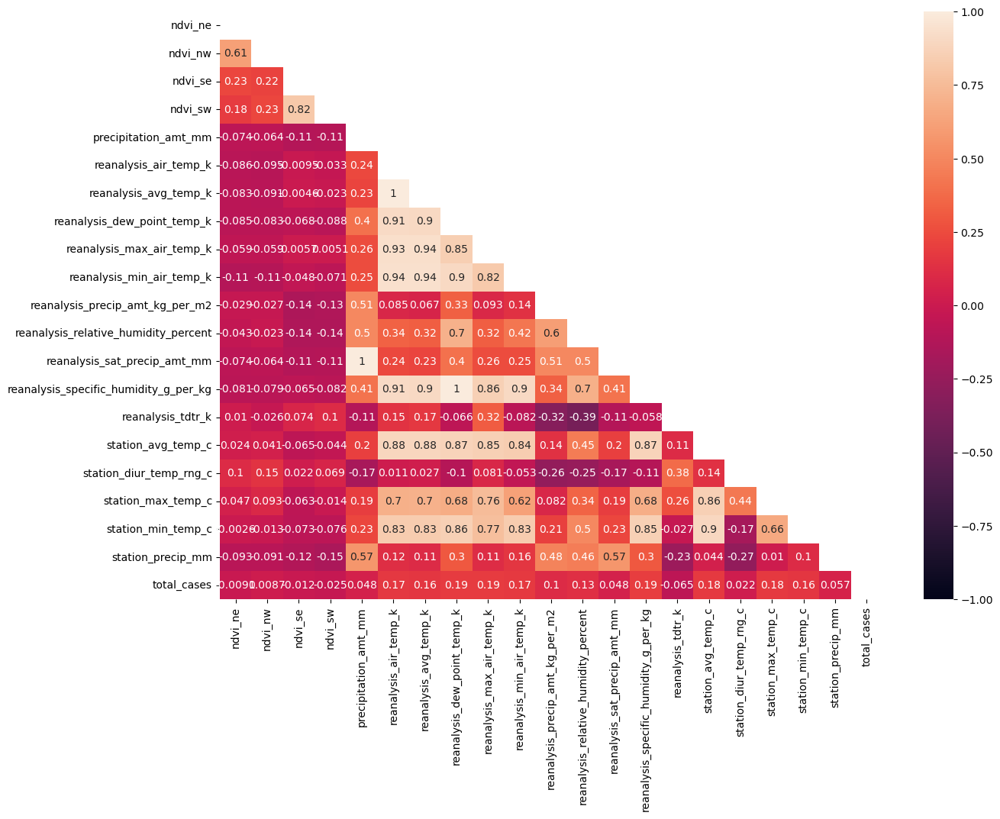

In [42]:
corrMat = df_train.loc[df_train['city']=='sj',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


In [44]:
# corrMat[corrMat>0.9]
pair = []
for c in corrMat:
    if any(abs(corrMat[c])>0.9):
        high_corr = corrMat[abs(corrMat[c])>0.9].index.to_list()
    if len(high_corr)>1:
        print(high_corr)

['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_min_air_temp_k']
['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']


### Correlation -- Iquitos

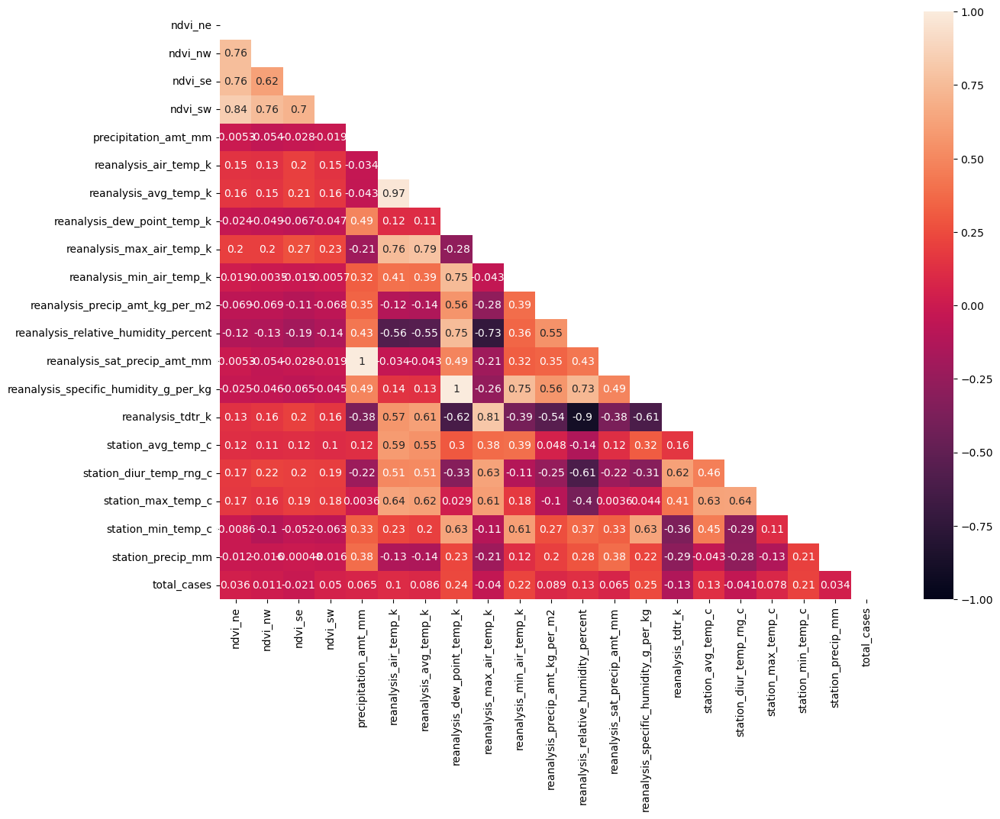

In [40]:
corrMat = df_train.loc[df_train['city']=='iq',features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


### Identify highly correlated variables``

In [41]:
# corrMat[corrMat>0.9]
pair = []
for c in corrMat:
    if any(abs(corrMat[c])>0.9):
        high_corr = corrMat[corrMat[c]>0.9].index.to_list()
    if len(high_corr)>1:
        print(high_corr)

['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k']
['reanalysis_air_temp_k', 'reanalysis_avg_temp_k']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']


In [ ]:
from sklearn.manifold import MDS
dist_mat=1-corrMat
mds = MDS(n_components=2, dissimilarity='precomputed', normalized_stress='auto')
mds_out = mds.fit_transform(dist_mat)

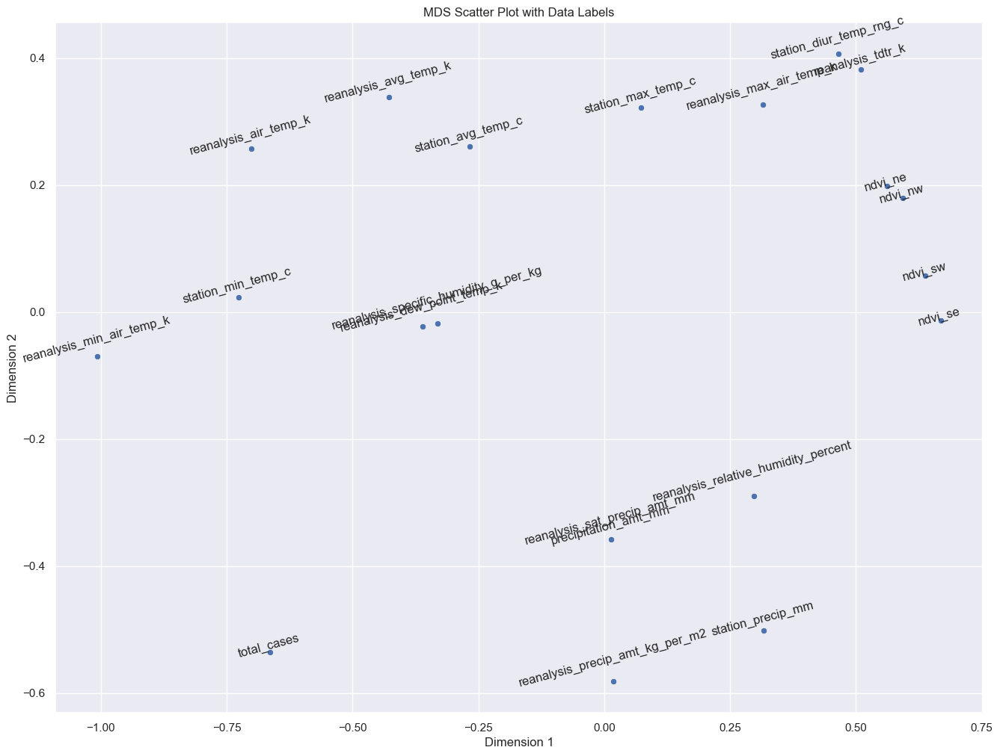

In [ ]:
mds_out = pd.DataFrame(mds_out, columns=['c1', 'c2'])
mds_out.index = mds.feature_names_in_

plt.figure(figsize=(16, 12))
sns.scatterplot(data=mds_out,x='c1', y='c2')

for label, x, y in zip(mds_out.index, mds_out['c1'], mds_out['c2']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(-1, -5), ha='center', rotation=15)

# Show the plot
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('MDS Scatter Plot with Data Labels')
plt.show()

In [ ]:
mds.feature_names_in_

array(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
       'total_cases'], dtype=object)

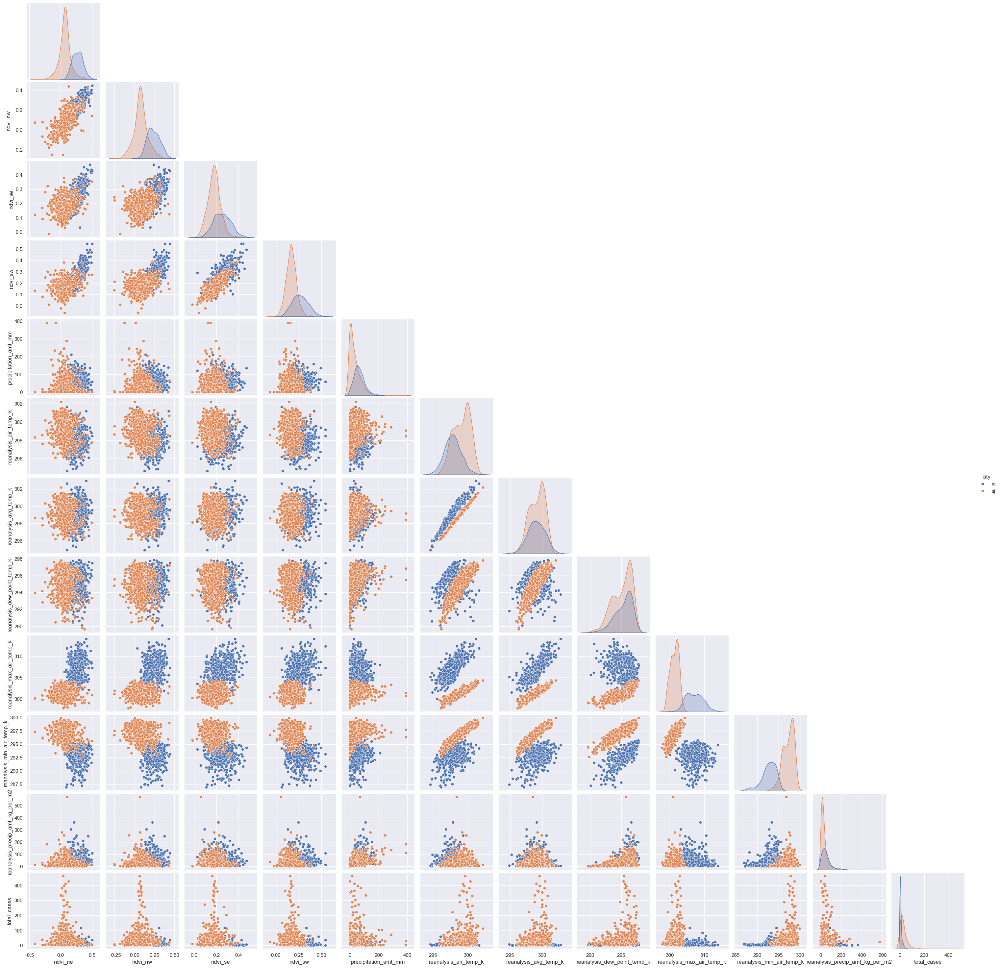

In [ ]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

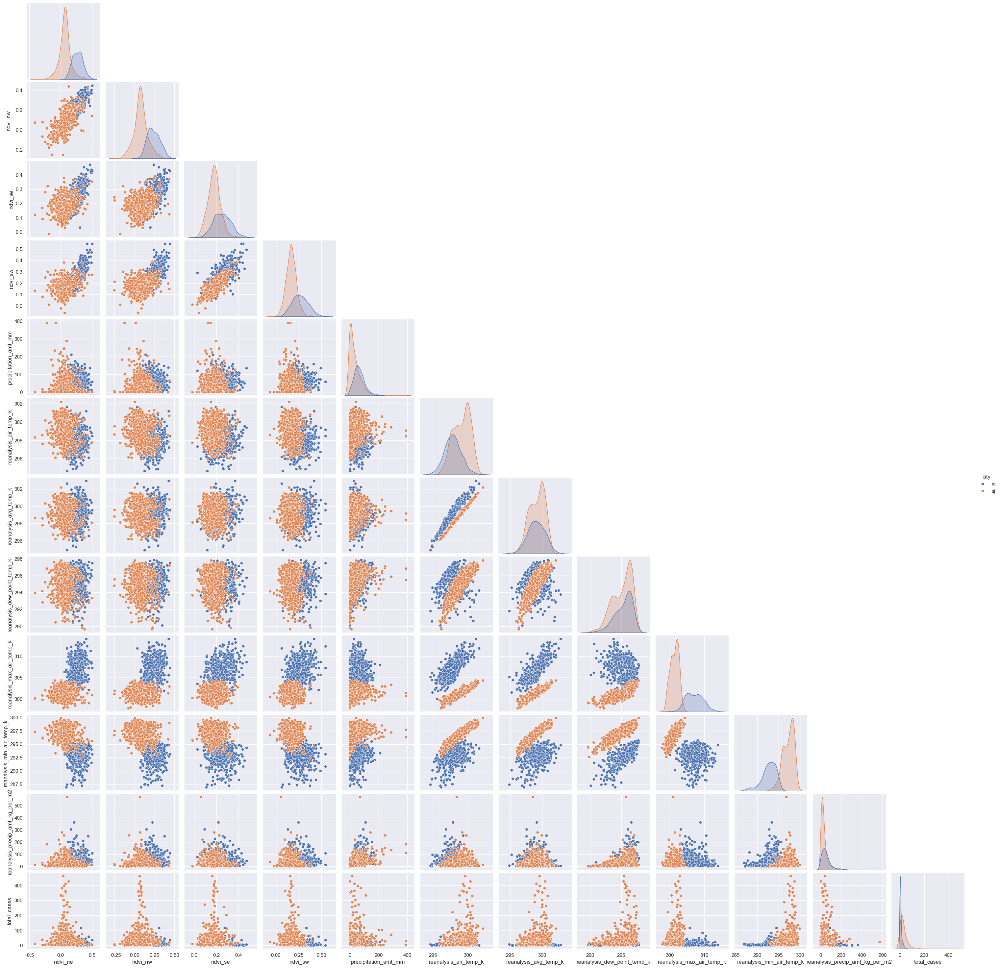

In [ ]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps

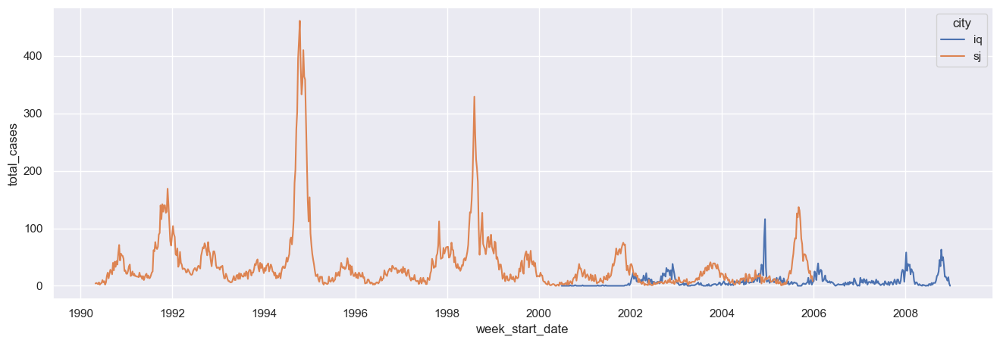

In [ ]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

## Iquitos - Total cases
- number of cases are generally high towards end of year (week 40 - 52) and at the beginning of year (week 1 to week 10)
- time feature may me important

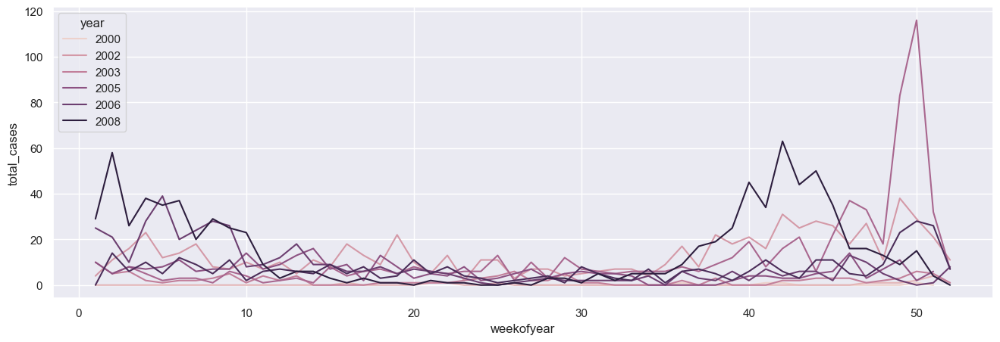

In [ ]:
sns.lineplot(data=df_train.loc[df_train['city']=='iq'], x= 'weekofyear', y = 'total_cases', hue='year')
plt.show()

## Cases San Juan
- Also, number of cases are higher towards end of year from around week 35 - 52, and at the beginning of year week 1 - 10 with some few exceptions

In [ ]:
# Identify outlier years
# 
outlier_years_sj = df_train.loc[df_train['city']=='sj'].loc[df_train['total_cases']>200,'year'].unique() 
years_sj = df_train.loc[df_train['city']=='sj']['year'].unique()
normal_years_sj = [i for i in years_sj if i not in outlier_years_sj]

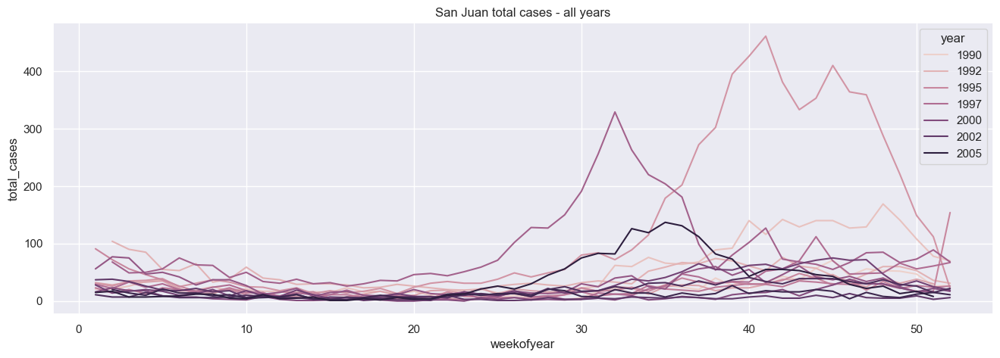

In [ ]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - all years')
plt.show()

Outlier years were identified as those containing too many cases relative to others, distorting the scale. The threshold was 200 cases.

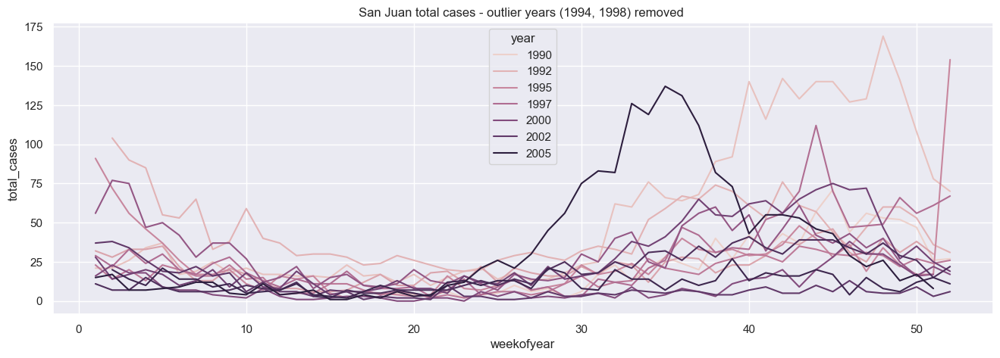

In [ ]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(normal_years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - outlier years (1994, 1998) removed ')
plt.show()

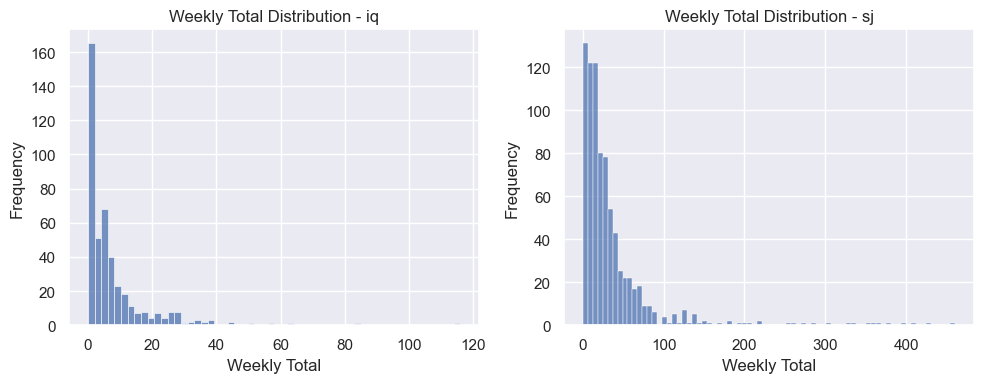

In [ ]:
# 
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for i, city in enumerate(cities):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'Weekly Total Distribution - {city}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


yearly_pattern(df_train, 'city', 'total_cases')

Seems like week 1 and week 53 are the most problematic in the dataset

In [ ]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [ ]:
df_med


,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by 
 - There is considerable difference in climate and vegetation between the two cities

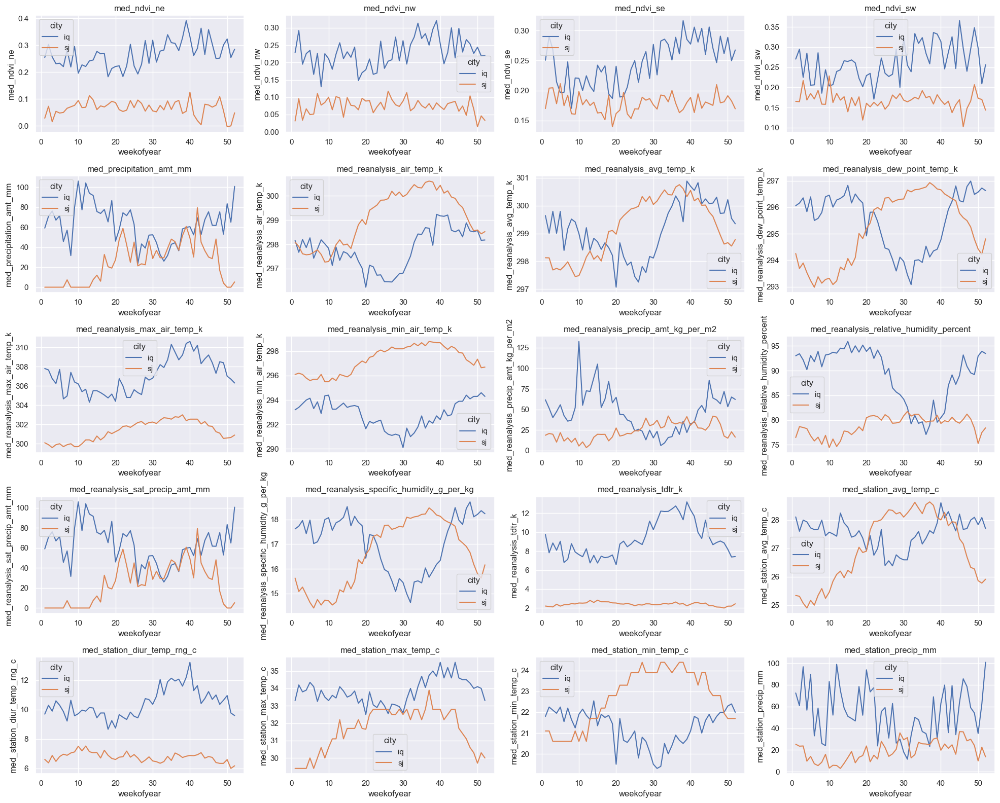

In [ ]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized)

In [ ]:
df_train_iq.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

## Iquitos
Key observations:
- There is a lagged commovement between temperature and total disease cases in iquitos, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

In [ ]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

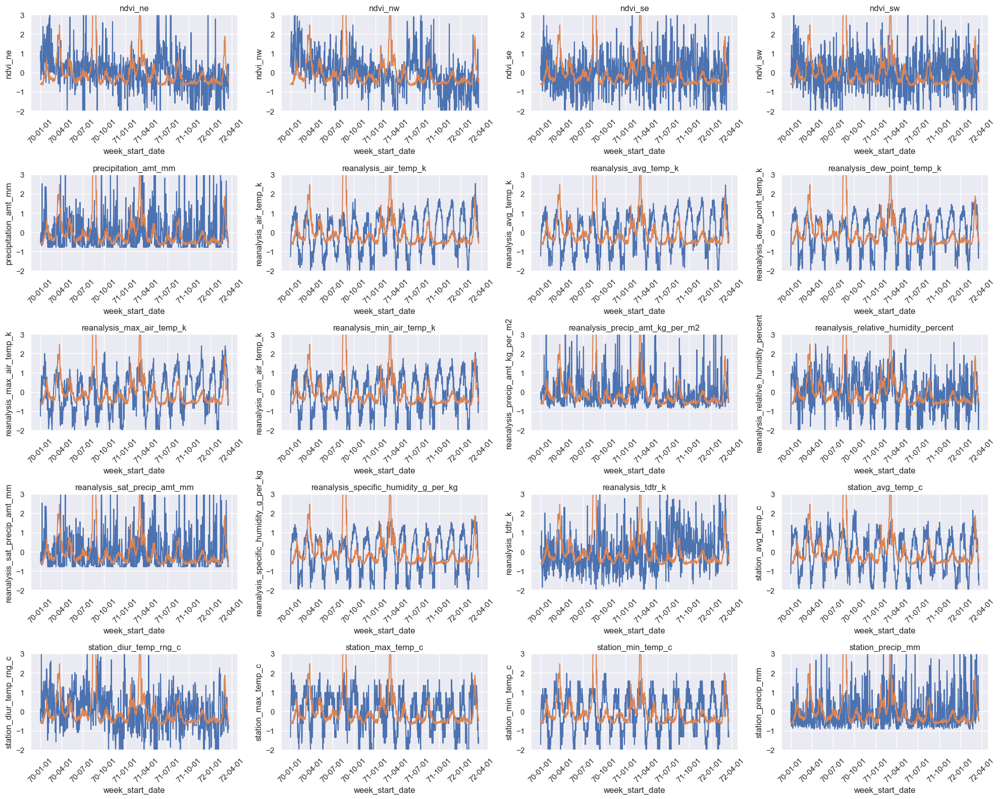

In [ ]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

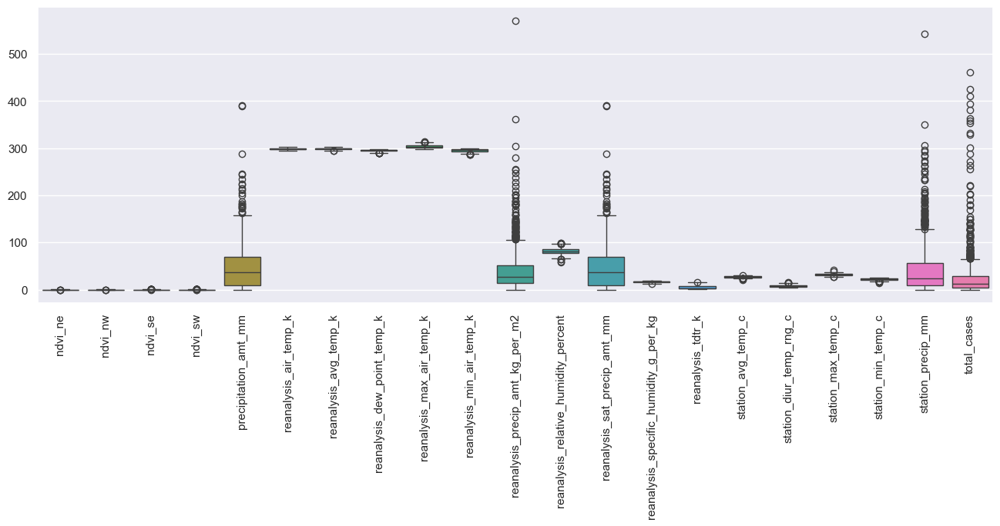

In [ ]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots
- There is considerable difference between cities esp. for vegetation, humidity and temperature
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

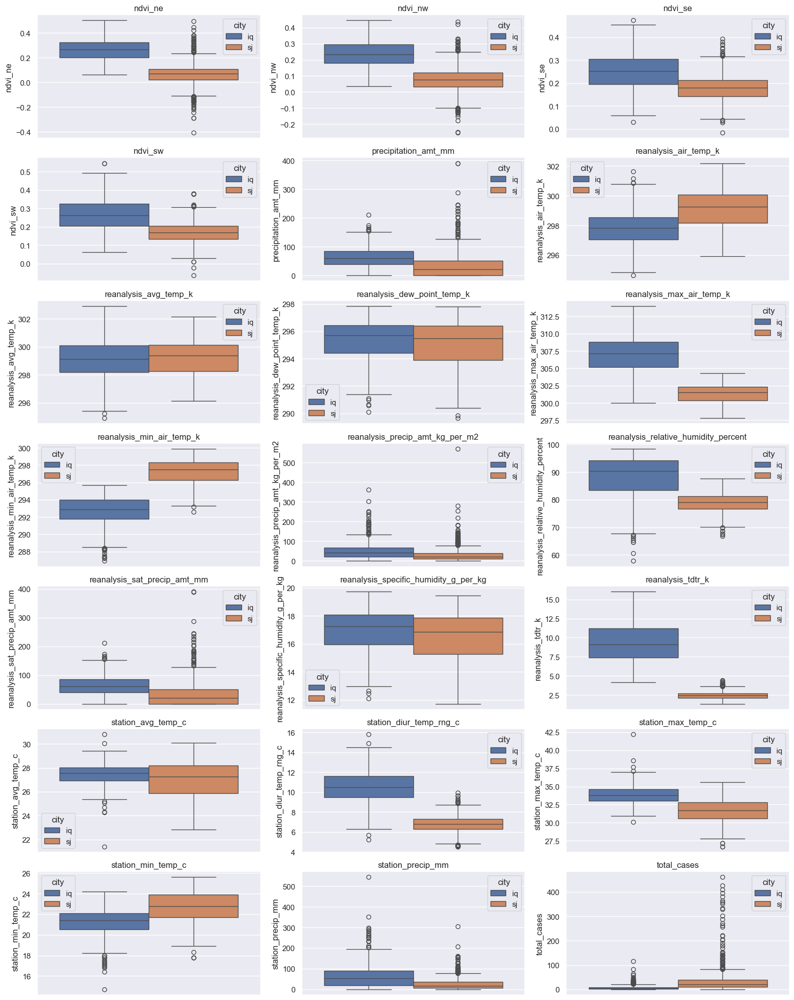

In [ ]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

In [ ]:
ndvi = list(filter(lambda x: re.search(r'ndvi_', x), features))
precip = list(filter(lambda x: re.search(r'preci', x), features))
humid = list(filter(lambda x: re.search(r'humid', x), features))
temp = list(filter(lambda x: re.search(r'temp|tdtr', x), features))
# tdtr = list(filter(lambda x: re.search(r'tdtr', x), features))

In [ ]:
## PCA PLOTS
from sklearn.decomposition import PCA
pca = PCA(n_components=2, whiten=True)

pca_ndvi = pca.fit_transform(df_train.loc[df_train['city']=='sj',ndvi])
print('ndvi', pca.explained_variance_ratio_)
pca_ndvi = pd.DataFrame(pca_ndvi, columns=['pc1','pc2'])


pca_precip = pca.fit_transform(df_train.loc[df_train['city']=='sj',precip])
print('precip', pca.explained_variance_ratio_)
pca_precip = pd.DataFrame(pca_precip, columns=['pc1','pc2'])

pca_temp = pca.fit_transform(df_train.loc[df_train['city']=='sj',temp])
print('temp', pca.explained_variance_ratio_)
pca_temp = pd.DataFrame(pca_temp, columns=['pc1','pc2'])


ndvi [0.60810573 0.22842592]
precip [0.77866656 0.1463693 ]
temp [0.79642597 0.10359842]


In [ ]:
df_train.loc[:,'l_total_cases'] = np.log(1+df_train['total_cases'])

#EDA: Data Visualization
[Helen]

In [ ]:
# df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
# df_train.set_index('week_start_date', inplace=True)

In [ ]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'iq']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of Iquitos:


*   The trend appears to be stable with slight flunctuations over the years, a slight upward trend can be observed around 2005 but it returns to more average levels afterward and then rises before 2007.
*   The Seasonal pattern is clear and consistent over the years. Peaks and troughs appear regularly, indicating consistent wetter and drier periods each year.
*   The residuals, which represent the noise after removing the trend and seasonality, don't show any significant outliers or patterns. They're relatively stable and clustered around the zero line.

In [ ]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'sj']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of San Juan:


*   The trend appears to be stable with slight undulations over the years, there is no strong long term increase or decrease in the population during the time period.
*   The Seasonal pattern is clear and consistent over the years. The amplitude of the season flunctuations are roughly the same size each year.
*   The residuals have a few outliers, seen as dots further away 

##### Dropping one highly correlated variables from the following pairs, 
- ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
- ['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
- ['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']

## Prepare training and testing data

In [ ]:
## Generate dummies for outliers
# This applies for training data, we pretend we dont know labels for testing data
df_train['month'] = df_train['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

df_test['month'] = df_test['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

In [ ]:
df_train.loc[:,'month'].value_counts()


month
7     125
10    118
4     116
9     107
1     107
8     100
11    100
12    100
5      96
6      96
2      92
3      92
Name: count, dtype: int64

In [ ]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only
colums2drop = ['city', 'weekofyear','year','week_start_date', 'reanalysis_sat_precip_amt_mm', 'reanalysis_specific_humidity_g_per_kg', 
               'reanalysis_tdtr_k', 'total_cases', 'l_total_cases']
features2keep = [f for f in df_train.columns if f not in colums2drop]

# def generate_training_test_sets()
X_train_iq = df_train.loc[df_train['city']=='iq',features2keep]
X_train_sj = df_train.loc[df_train['city']=='sj',features2keep]

# Settting indices
# X_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# X_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Test set
X_test_iq = df_test.loc[df_test['city']=='iq',features2keep]
X_test_sj = df_test.loc[df_test['city']=='sj',features2keep]

# Settting indices
# X_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# X_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']

# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Settting indices
# y_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
# y_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

# y_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
# y_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']



In [ ]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [ ]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


## MODELS

In [ ]:
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

CITY = 'iq'
# Model without parameter tuning - San Juan

scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf', C=0.6)
tscv = TimeSeriesSplit(n_splits=5)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('tranform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

# compute cross validation error
mae_cv = cross_val_score(estimator= pipeline,X=X_train_iq, y=y_train_iq, cv=tscv)
print(f"MAE cv {CITY} {-np.mean(mae_cv)}")


model = pipeline.fit(X=X_train_iq, y=y_train_iq)
# y_pred_tr = model.predict(X_train_iq)

y_pred_iq = model.predict(X_test_iq)



mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE: {mae:.2f}")


MAE cv iq 0.5783546107596772
MAE: 5.09


In [ ]:
lasso_selector = model.named_steps['select'].named_steps['lasso']

# Get the selected feature indices
selected_feature_indices = lasso_selector.get_support()

# Get the selected feature names
selected_feature_names = X_train_iq.columns[selected_feature_indices]
print(selected_feature_names)

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'station_max_temp_c', 'station_min_temp_c', 'month'],
      dtype='object')


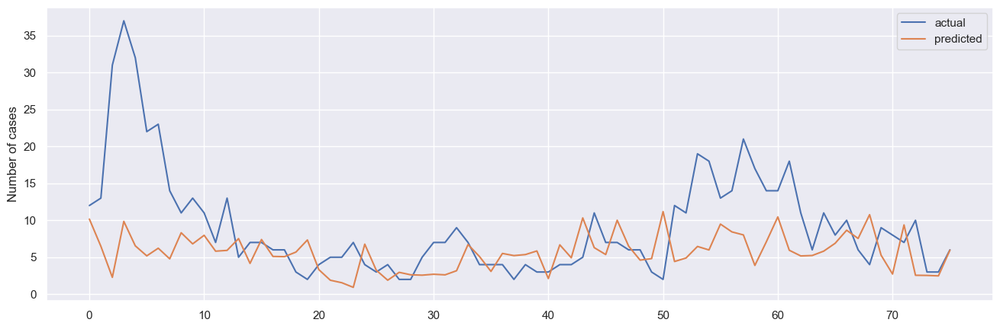

In [ ]:
y_pred_iq = pd.Series(y_pred_iq, index=y_test_iq.index)

plt.plot(y_test_iq, label='actual')
plt.plot(y_pred_iq, label = 'predicted')
plt.legend()
plt.ylabel('Number of cases')
plt.show()

In [ ]:
# Model without parameter tuning - San Iquitos
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf',C=0.3)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('target_transform', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

model = pipeline.fit(X=X_train_sj, y=y_train_sj)
# y_pred_tr = model.predict(X_train_iq)

y_pred_sj = model.predict(X_test_sj)

mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE: {mae:.2f}")

MAE: 14.69


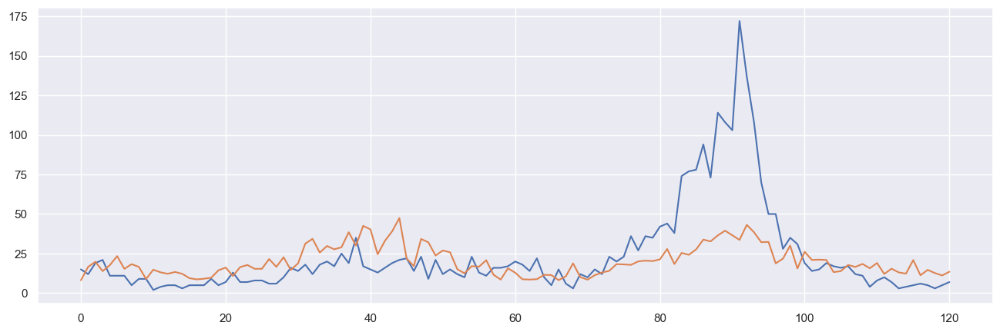

In [ ]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


## Finetuning SVR

In [ ]:
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep)])

# Define the transformed target regressor
regressor = SVR(kernel='rbf')
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector), ('transform_target', target_transformer)])

# Define the hyperparameter grid for grid search
param_grid = {
    'transform_target__regressor__C': np.linspace(0.001, 0.1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 10)
}

# Perform grid search

tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_mean_absolute_error')
models = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, scoring='neg_mean_absolute_error')

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
# print(f"MAE on test set -{CITY}: {mae:.2f}")


Cross-validated MAE -iq: 6.49


In [ ]:
# for i, (tri, tsi) in enumerate(tscv.split(X_train_iq)):
#     print(f"fold {i}")
#     print(f" Train indices {tri}")
#     print(f" Test indices {tsi}")



In [ ]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'C': 0.012,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 0.001,
 'kernel': 'linear',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

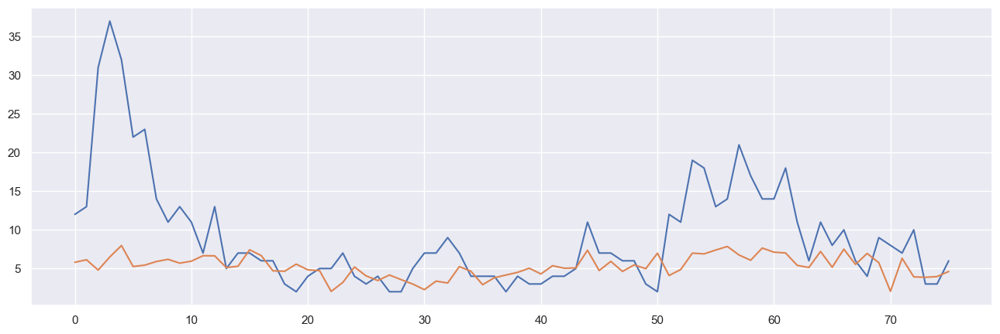

In [ ]:
plt.plot(np.array(y_test_iq))
plt.plot(y_pred_iq)


In [ ]:
CITY = 'sj'

param_grid = {
    'transform_target__regressor__C': np.linspace(0.001, 0.9, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    # 'transform_target__regressor__gamma': np.linspace(0.01, 0.1, 10)
}

models = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, scoring='neg_mean_absolute_error')

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE on test set -{CITY}: {mae:.2f}")

Cross-validated MAE -sj: 25.91
MAE on test set -sj: 14.69


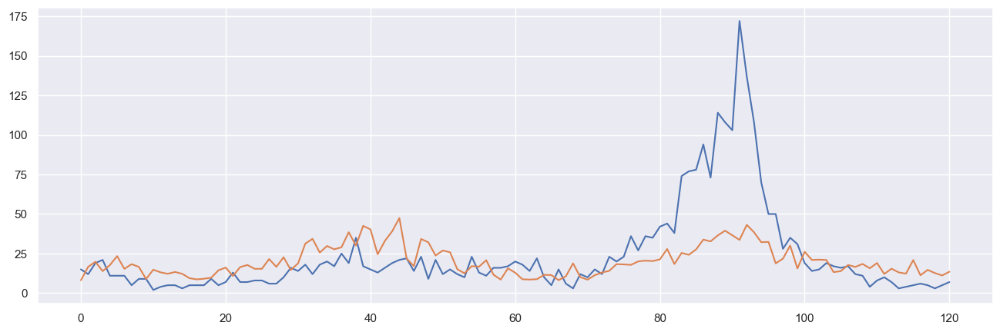

In [ ]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


## LSTM

In [ ]:
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout, Attention
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.losses import MeanSquaredError, MeanAbsoluteError
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.optimizers import Adam
from keras.optimizers import Adam

tf.random.set_seed(2024)

# Prepare data
time_steps = 4

def data_to_3D(dfx, dfy, time_steps):
    X = []
    y = []
    for i in range(len(dfx) - time_steps):
        X.append(dfx[i:i+time_steps])  # Extracting past 'time_steps' weeks data for each sample
        y.append(dfy.values[i+time_steps])     # Extracting the target variable for the next week
    return np.array(X), np.array(y)


scaler = RobustScaler()

# Training and validation data
XX_train_iq1, yy_train_iq1 = X_train_iq.iloc[:len(X_train_iq)-103,:], y_train_iq[:len(y_train_iq)-103]
XX_val_iq1, yy_val_iq1 = X_train_iq.iloc[len(X_train_iq)-103:,:], y_train_iq[len(y_train_iq)-103:]

# scale data
XX_train_iq2 = scaler.fit_transform(XX_train_iq1)
XX_val_iq2 = scaler.fit_transform(XX_val_iq1)
X_test_iq2 = scaler.fit_transform(X_test_iq)
# Converting data to 3D
XX_train_iq, yy_train_iq = data_to_3D(XX_train_iq2, yy_train_iq1, time_steps=time_steps)
XX_val_iq, yy_val_iq = data_to_3D(XX_val_iq2, yy_val_iq1, time_steps=time_steps)
XX_test_iq, yy_test_iq = data_to_3D(X_test_iq2, y_test_iq, time_steps=time_steps)
# # scale
# X_test_iq = scaler.fit_transform(X_test_iq)


model = Sequential([
    InputLayer(input_shape=(time_steps, 18)),
    LSTM(5),
    Dropout(0.2),
    # Attention(name='attention_weights'),
    Dense(units=500, activation='relu'),
    Dense(units=100, activation='relu'),
    Dense(units=1, activation='linear')
])

model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
check_point = ModelCheckpoint('model/', save_best_only=True)

model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.01), metrics=[MeanAbsoluteError()])
model.fit(XX_train_iq, yy_train_iq, validation_data=(XX_val_iq, yy_val_iq), epochs=60, callbacks=[early_stopping,check_point])



Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_30 (LSTM)              (None, 5)                 480       
                                                                 
 dropout_30 (Dropout)        (None, 5)                 0         
                                                                 
 dense_86 (Dense)            (None, 500)               3000      
                                                                 
 dense_87 (Dense)            (None, 100)               50100     
                                                                 
 dense_88 (Dense)            (None, 1)                 101       
                                                                 
Total params: 53,681
Trainable params: 53,681
Non-trainable params: 0
_________________________________________________________________
Epoch 1/60
 1/11 [=>............................]

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 230ms/step - loss: 126.7352 - mean_absolute_error: 6.1834 - val_loss: 211.1282 - val_mean_absolute_error: 8.2995
Epoch 2/60
 1/11 [=>............................] - ETA: 0s - loss: 27.6238 - mean_absolute_error: 4.2796

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 326ms/step - loss: 106.2286 - mean_absolute_error: 5.8007 - val_loss: 179.4625 - val_mean_absolute_error: 7.8722
Epoch 3/60
11/11 [==============================] - 0s 6ms/step - loss: 100.9566 - mean_absolute_error: 6.0959 - val_loss: 236.4858 - val_mean_absolute_error: 8.9215
Epoch 4/60
11/11 [==============================] - 0s 6ms/step - loss: 111.0487 - mean_absolute_error: 5.5977 - val_loss: 198.1305 - val_mean_absolute_error: 8.2143
Epoch 5/60
 1/11 [=>............................] - ETA: 0s - loss: 41.0281 - mean_absolute_error: 4.2073

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 211ms/step - loss: 96.5755 - mean_absolute_error: 5.8902 - val_loss: 179.0797 - val_mean_absolute_error: 7.7300
Epoch 6/60
11/11 [==============================] - 0s 7ms/step - loss: 89.7195 - mean_absolute_error: 5.7575 - val_loss: 207.6788 - val_mean_absolute_error: 8.4552
Epoch 7/60
11/11 [==============================] - 0s 6ms/step - loss: 89.7277 - mean_absolute_error: 5.1722 - val_loss: 194.8209 - val_mean_absolute_error: 8.0401
Epoch 8/60
11/11 [==============================] - 0s 5ms/step - loss: 79.0581 - mean_absolute_error: 5.4557 - val_loss: 231.6643 - val_mean_absolute_error: 8.8496
Epoch 9/60
 1/11 [=>............................] - ETA: 0s - loss: 10.9991 - mean_absolute_error: 2.5287

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 208ms/step - loss: 75.0106 - mean_absolute_error: 5.0896 - val_loss: 178.8468 - val_mean_absolute_error: 7.8146
Epoch 10/60
 1/11 [=>............................] - ETA: 0s - loss: 65.9142 - mean_absolute_error: 5.9579

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 201ms/step - loss: 52.9946 - mean_absolute_error: 5.1434 - val_loss: 173.1543 - val_mean_absolute_error: 7.5741
Epoch 11/60
11/11 [==============================] - 0s 7ms/step - loss: 72.4539 - mean_absolute_error: 5.1609 - val_loss: 190.1299 - val_mean_absolute_error: 7.8484
Epoch 12/60
 1/11 [=>............................] - ETA: 0s - loss: 47.0943 - mean_absolute_error: 4.6577

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 209ms/step - loss: 65.4807 - mean_absolute_error: 5.0153 - val_loss: 170.4682 - val_mean_absolute_error: 7.5373
Epoch 13/60
11/11 [==============================] - 0s 7ms/step - loss: 49.3115 - mean_absolute_error: 4.7418 - val_loss: 227.5911 - val_mean_absolute_error: 8.7009
Epoch 14/60
11/11 [==============================] - 0s 6ms/step - loss: 64.5144 - mean_absolute_error: 4.8323 - val_loss: 175.8974 - val_mean_absolute_error: 7.8119
Epoch 15/60
11/11 [==============================] - 0s 6ms/step - loss: 52.4060 - mean_absolute_error: 5.0596 - val_loss: 194.9332 - val_mean_absolute_error: 8.0543
Epoch 16/60
11/11 [==============================] - 0s 6ms/step - loss: 47.2164 - mean_absolute_error: 4.4859 - val_loss: 209.2430 - val_mean_absolute_error: 8.4297
Epoch 17/60
 1/11 [=>............................] - ETA: 0s - loss: 64.3942 - mean_absolute_error: 4.9956

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 206ms/step - loss: 42.6640 - mean_absolute_error: 4.7423 - val_loss: 164.4957 - val_mean_absolute_error: 7.5684
Epoch 18/60
11/11 [==============================] - 0s 6ms/step - loss: 38.2112 - mean_absolute_error: 4.3066 - val_loss: 201.7709 - val_mean_absolute_error: 8.2420
Epoch 19/60
11/11 [==============================] - 0s 6ms/step - loss: 41.9682 - mean_absolute_error: 4.5584 - val_loss: 174.7108 - val_mean_absolute_error: 7.9926
Epoch 20/60
11/11 [==============================] - 0s 6ms/step - loss: 33.0074 - mean_absolute_error: 4.0877 - val_loss: 188.6280 - val_mean_absolute_error: 7.9852
Epoch 21/60
11/11 [==============================] - 0s 6ms/step - loss: 35.9253 - mean_absolute_error: 4.3309 - val_loss: 172.1289 - val_mean_absolute_error: 7.7029
Epoch 22/60
11/11 [==============================] - 0s 5ms/step - loss: 37.9823 - mean_absolute_error: 4.0271 - val_loss: 183.3103 - val_mean_absolute_error: 7.8749
Epoch 23/60
11

4/4 [==============================] - 0s 2ms/step


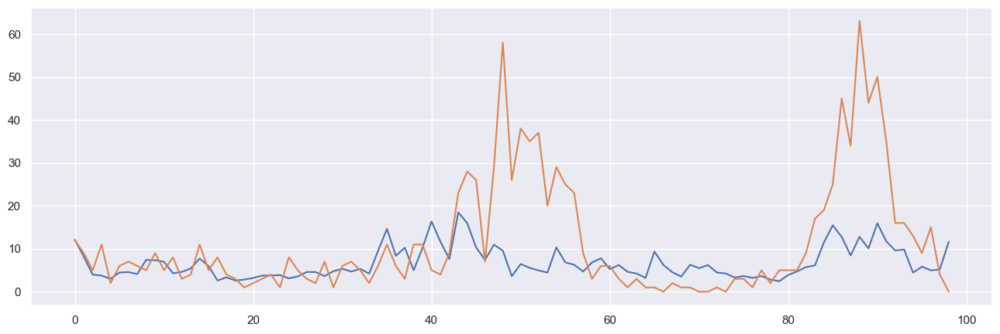

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('model/')

pred_train = model.predict(XX_val_iq).flatten()
output_train = pd.DataFrame({'Pred Train': pred_train, 'Actual':yy_val_iq})
# output_train
plt.plot(output_train['Pred Train'])
plt.plot(output_train['Actual'])


3/3 [==============================] - 0s 3ms/step
MAE 5.178396509753333


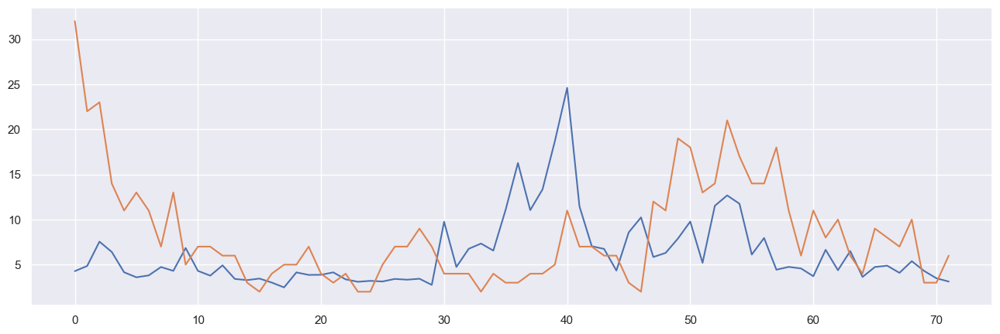

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('model/')

pred_test = model.predict(XX_test_iq).flatten()
output_test = pd.DataFrame({'Pred': pred_test, 'Actual':yy_test_iq})
# output_train
plt.plot(output_test['Pred'])
plt.plot(output_test['Actual'])
print(f"MAE {mean_absolute_error(y_pred=pred_test, y_true=yy_test_iq)}")


In [ ]:
import xgboost
from xgboost import XGBRegressor


CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep)])

# Define the transformed target regressor
xgb = XGBRegressor(n_estimators=500, learning_rate = 0.01, max_depth=5)

# xgb.fit(X_train_iq, y_train_iq)
target_transformer = TransformedTargetRegressor(regressor=xgb, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('transform_target', target_transformer)])

# tscv = TimeSeriesSplit(n_splits=5)

model = pipeline.fit(X_train_iq, y_train_iq)
y_pred_iq = model.predict(X_test_iq)

mae = mean_absolute_error(y_pred=y_pred_iq, y_true=y_test_iq )
print(mae)


5.254158462348737


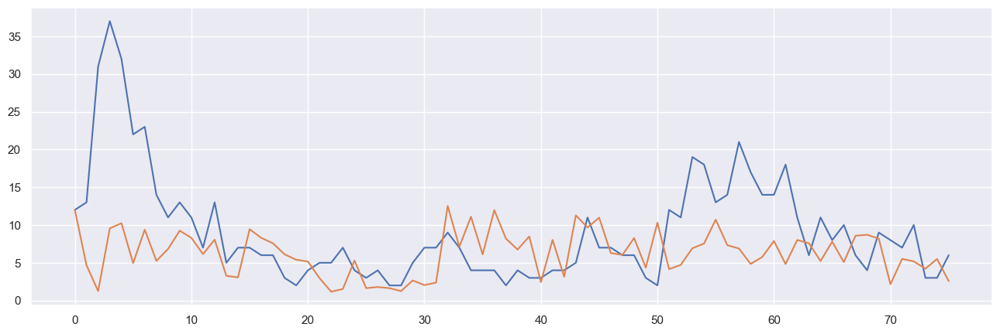

In [ ]:

# output_train
plt.plot(y_test_iq)
plt.plot(y_pred_iq)


In [ ]:
help(xgb)

Help on XGBRegressor in module xgboost.sklearn object:

class XGBRegressor(XGBModel, sklearn.base.RegressorMixin)
 |  XGBRegressor(*, objective: Union[str, Callable[[numpy.ndarray, numpy.ndarray], Tuple[numpy.ndarray, numpy.ndarray]], NoneType] = 'reg:squarederror', **kwargs: Any) -> None
 |  
 |  Implementation of the scikit-learn API for XGBoost regression.
 |  
 |  
 |  Parameters
 |  ----------
 |  
 |      n_estimators : int
 |          Number of gradient boosted trees.  Equivalent to number of boosting
 |          rounds.
 |  
 |      max_depth :  Optional[int]
 |          Maximum tree depth for base learners.
 |      max_leaves :
 |          Maximum number of leaves; 0 indicates no limit.
 |      max_bin :
 |          If using histogram-based algorithm, maximum number of bins per feature
 |      grow_policy :
 |          Tree growing policy. 0: favor splitting at nodes closest to the node, i.e. grow
 |          depth-wise. 1: favor splitting at nodes with highest loss change.
 |